<div>Загрузить данные из csv-файла, содержащего набор данных «Яблоки-груши»</div>
<div>Построить изображение набор данных «Яблоки-груши» в виде точек на плоскости</div>
<div>Выделить из набора данных матрицу признаков (Х) и вектор ответов (у) </div>
<div>Импортировать необходимые библиотеки:</div>

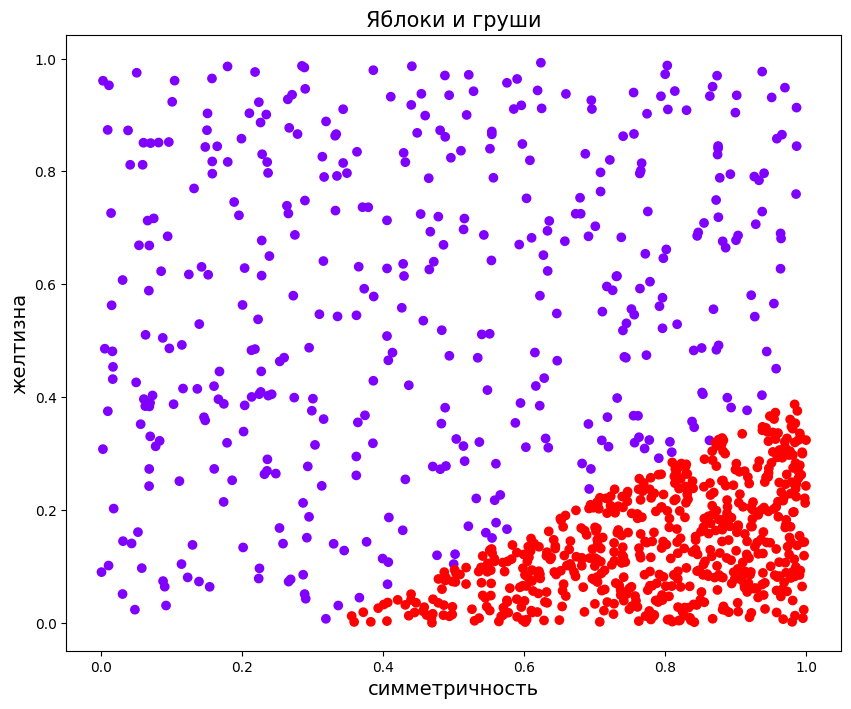

In [18]:
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
import os

dir = os.getcwd()[0:31] + "input/apples_pears.csv"
data = pd.read_csv(dir)
X = data.iloc[:,:2].values                   # матрица объекты-признаки
y = data['target'].values.reshape((-1, 1))   # классы (столбец из нулей и единиц)
plt.figure(figsize=(10, 8)) 
plt.scatter(data.iloc[:, 0], data.iloc[:, 1], c=data['target'], cmap='rainbow') 
plt.title('Яблоки и груши', fontsize=15) 
plt.xlabel('симметричность', fontsize=14) 
plt.ylabel('желтизна', fontsize=14) 
plt.show();

<div>пути объявления нейросетей в PyTorch</div>

In [19]:
import torch 
from torch.nn import Linear, Sigmoid

<div>Мы просто создали объект класса Sequential, который состоит из одного линейного 
слоя размерности (num_features, 1) и последующего применения сигмоиды. Но уже сейчас 
его  можно  применить  к  объекту  (тензору),  просто  веса  в  начале  инициализирутся 
случайно и при forward_pass'е мы получим какой-то ответ пока что необученного нейрона:</div>

In [20]:
num_features = X.shape[1] 
 
neuron = torch.nn.Sequential( 
Linear(num_features, out_features=1), 
Sigmoid() 
)

<div>Получим результат классификации пока ещё необученным нейроном:</div>

In [21]:
neuron(torch.autograd.Variable(torch.FloatTensor([1, 1])))

tensor([0.5917], grad_fn=<SigmoidBackward0>)

<div>Обучим нейрон. Обернём данные в torch.Tensor'ы, а тензоры в torch.Variable'ы, 
чтобы можно было вычислять градиенты по весам:</div>

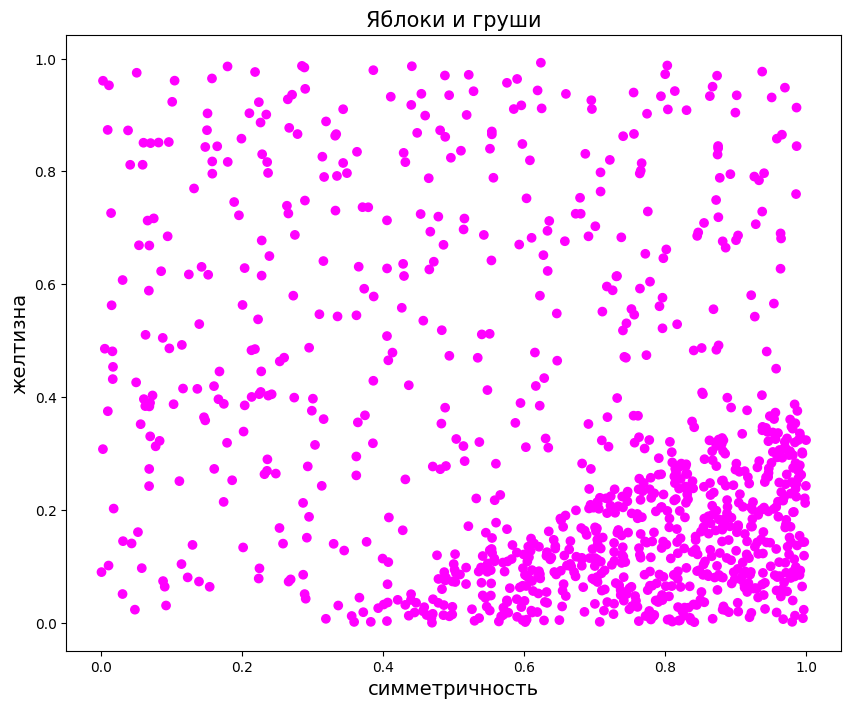

In [22]:
proba_pred = neuron(torch.autograd.Variable(torch.FloatTensor(X))) 
y_pred = proba_pred > 0.5 
y_pred = y_pred.data.numpy().reshape(-1) 
 
plt.figure(figsize=(10, 8)) 
plt.scatter(data.iloc[:, 0], data.iloc[:, 1], c=y_pred, cmap='spring') 
plt.title('Яблоки и груши', fontsize=15) 
plt.xlabel('симметричность', fontsize=14) 
plt.ylabel('желтизна', fontsize=14) 
plt.show()

<div>Код обучения одного нейрона на PyTorch:</div>

In [24]:
X = torch.autograd.Variable(torch.FloatTensor(X)) 
y = torch.autograd.Variable(torch.FloatTensor(y))
# квадратичная функция потерь (можно сделать другую, например, LogLoss) 
loss_fn = torch.nn.MSELoss(reduction='none') 
 
# шаг градиентного спуска (точнее -- метода оптимизации) 
learning_rate = 0.001                   # == 1e-3 
 
# сам метод оптимизации нейросети (обычно лучше всего по-умолчанию работает Adam) 
optimizer = torch.optim.SGD(neuron.parameters(), lr=learning_rate) 
 
# количество итераций в градиентном спуске равно num_epochs, здесь 500 
for t in range(500): 
    # foward_pass() -- применение нейросети (этот шаг ещё называют inference) 
    y_pred = neuron(X) 
 
    # выведем loss 
    loss = loss_fn(y_pred, y) 
    print('{} {}'.format(t, loss.data)) 
 
    # обнуляем градиенты перед backard_pass'ом (обязательно!) 
    optimizer.zero_grad() 
 
    # backward_pass() -- вычисляем градиенты loss'а по параметрам (весам) нейросети 
    # этой командой мы только вычисляем градиенты, но ещё не обновляем веса 
    loss.sum().backward()
 
    # а тут уже обновляем веса 
    optimizer.step()

0 tensor([[0.1907],
        [0.2057],
        [0.2070],
        [0.4014],
        [0.1928],
        [0.2060],
        [0.2083],
        [0.2215],
        [0.3815],
        [0.3187],
        [0.2002],
        [0.1908],
        [0.1736],
        [0.2108],
        [0.1746],
        [0.1977],
        [0.2111],
        [0.2101],
        [0.2106],
        [0.2002],
        [0.3517],
        [0.3304],
        [0.2035],
        [0.2092],
        [0.1868],
        [0.2049],
        [0.4569],
        [0.1906],
        [0.3832],
        [0.4082],
        [0.1853],
        [0.2009],
        [0.3657],
        [0.1882],
        [0.2230],
        [0.1995],
        [0.1968],
        [0.1901],
        [0.2146],
        [0.4138],
        [0.2010],
        [0.2051],
        [0.4080],
        [0.2040],
        [0.4186],
        [0.3633],
        [0.1861],
        [0.2058],
        [0.2130],
        [0.2148],
        [0.1953],
        [0.2199],
        [0.3483],
        [0.3894],
        [0.1892],
        

<div>Получим результат классификации обученным нейроном:</div>

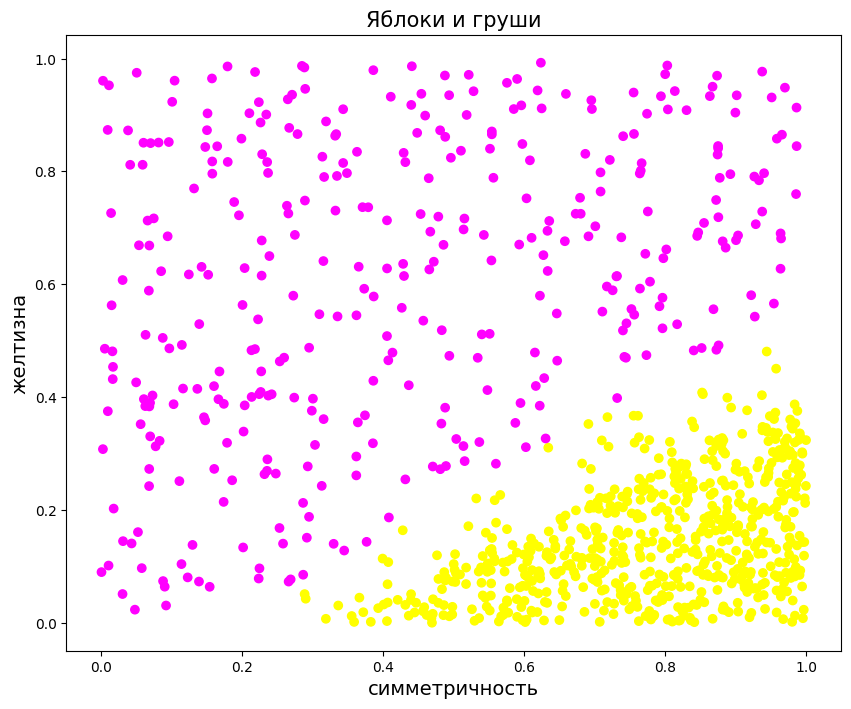

In [25]:
proba_pred = neuron(X) 
y_pred = proba_pred > 0.5 
y_pred = y_pred.data.numpy().reshape(-1) 
 
plt.figure(figsize=(10, 8)) 
plt.scatter(data.iloc[:, 0], data.iloc[:, 1], c=y_pred, cmap='spring') 
plt.title('Яблоки и груши', fontsize=15) 
plt.xlabel('симметричность', fontsize=14) 
plt.ylabel('желтизна', fontsize=14) 
plt.show()

<div>Можно  добиться  лучшего  качества  работы  путём  изменения learning_rate и 
количества итераций (возможно, ещё функции потерь и функции активации). Проведите 
вычислительный  эксперимент,  подобрав  такие  значения  learning_rate и  количество 
итераций, при которых качество работы нейрона будет наилучшим (сохраните все свои 
попытки  и  их  результаты),  также  попробуйте использовать  функцию 
потерь torch.nn.NLLLoss() или torch.nn.CrossEntropy().</div>

<div>Попробуем более сложную выборку, которая уже не разделяется линейно</div>

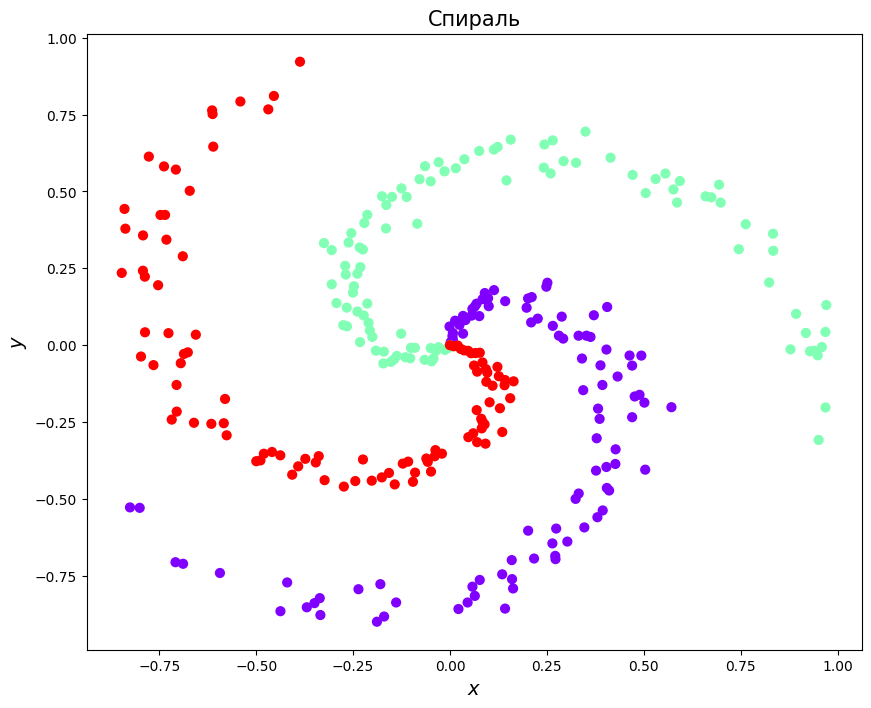

In [26]:
N = 100 
D = 2 
K = 3 
X = np.zeros((N * K, D)) 
y = np.zeros(N * K, dtype='uint8') 
 
for j in range(K): 
    ix = range(N * j,N * (j + 1)) 
    r = np.linspace(0.0, 1, N) 
    t = np.linspace(j * 4, (j + 1) * 4,N) + np.random.randn(N) * 0.2 # theta 
    X[ix] = np.c_[r * np.sin(t), r * np.cos(t)] 
    y[ix] = j 
 
plt.figure(figsize=(10, 8)) 
plt.scatter(X[:, 0], X[:, 1], c=y, s=40, cmap=plt.cm.rainbow) 
plt.title('Спираль', fontsize=15) 
plt.xlabel('$x$', fontsize=14) 
plt.ylabel('$y$', fontsize=14) 
plt.show()

<div>Преобразуем данные в Variable():</div>

In [28]:
X = torch.autograd.Variable(torch.FloatTensor(X)) 
y = torch.autograd.Variable(torch.LongTensor(y.astype(np.int64))) 
 
print(X.data.shape, y.data.shape) 

torch.Size([300, 2]) torch.Size([300])


<div>Попробуем  нейрон  с  сигмоидой на  линейно  неразделимой  выборке  (точнее  в 
данном случае это уже 3 нейрона с софтмаксом)</div>

In [29]:
# N - размер батча (batch_size, нужно для метода оптимизации) 
# D_in - размерность входа (количество признаков у объекта) 
# D_out - размерность выходного слоя (суть -- количество классов) 
N, D_in, D_out = 64, 2, 3 
 
neuron = torch.nn.Sequential( 
    torch.nn.Linear(D_in, D_out), 
) 
loss_fn = torch.nn.CrossEntropyLoss(reduction='none') 
 
learning_rate = 1e-4 
optimizer = torch.optim.SGD(neuron.parameters(), lr=learning_rate) 
for t in range(500): 
    # forward 
    y_pred = neuron(X) 
 
    # loss 
    loss = loss_fn(y_pred, y) 
    print('{} {}'.format(t, loss.data)) 
 
    # зануляем градиенты с предыдущего шага 
    optimizer.zero_grad() 
 
    # backward 
    loss.sum().backward() 
 
    # обновляем веса  
    optimizer.step()

0 tensor([1.3130, 1.3100, 1.3067, 1.3039, 1.3010, 1.2973, 1.2968, 1.2911, 1.2894,
        1.2845, 1.2820, 1.2781, 1.2753, 1.2721, 1.2689, 1.2659, 1.2629, 1.2596,
        1.2564, 1.2535, 1.2518, 1.2472, 1.2592, 1.2484, 1.2532, 1.2399, 1.2373,
        1.2533, 1.2594, 1.2603, 1.2416, 1.2226, 1.2189, 1.2515, 1.2708, 1.2483,
        1.2478, 1.3001, 1.2273, 1.2697, 1.2527, 1.2874, 1.2148, 1.3122, 1.2733,
        1.3218, 1.2490, 1.2573, 1.3426, 1.2443, 1.2857, 1.2822, 1.3072, 1.2879,
        1.3466, 1.3768, 1.3689, 1.3621, 1.4085, 1.4157, 1.2819, 1.3914, 1.3933,
        1.4703, 1.3566, 1.4568, 1.4180, 1.4277, 1.4445, 1.4755, 1.4675, 1.5111,
        1.5005, 1.4890, 1.4928, 1.5319, 1.5475, 1.5338, 1.5586, 1.5923, 1.5448,
        1.5689, 1.6072, 1.5799, 1.6083, 1.5916, 1.5729, 1.6283, 1.6338, 1.6306,
        1.6421, 1.6400, 1.6503, 1.6544, 1.6451, 1.6062, 1.6659, 1.6100, 1.6499,
        1.6513, 0.9736, 0.9697, 0.9672, 0.9718, 0.9668, 0.9714, 0.9560, 0.9521,
        0.9551, 0.9736, 0.9739, 0.9587

<div>Нарисуем результат:</div>

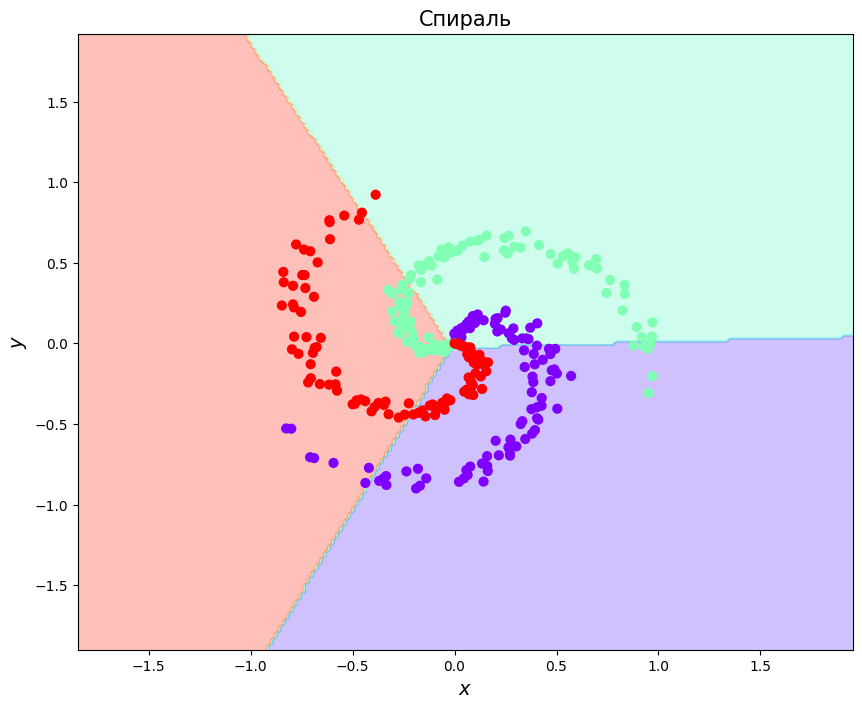

In [30]:
# Обратно в Numpy для отрисовки 
X = X.data.numpy() 
y = y.data.numpy() 
 
h = 0.02 
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1 
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1 
 
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), 
                     np.arange(y_min, y_max, h)) 
grid_tensor = torch.FloatTensor(np.c_[xx.ravel(), yy.ravel()]) 
 
Z = neuron(torch.autograd.Variable(grid_tensor)) 
Z = Z.data.numpy() 
Z = np.argmax(Z, axis=1) 
Z = Z.reshape(xx.shape) 
 
plt.figure(figsize=(10, 8)) 
 
plt.contourf(xx, yy, Z, cmap=plt.cm.rainbow, alpha=0.3) 
plt.scatter(X[:, 0], X[:, 1], c=y, s=40, cmap=plt.cm.rainbow) 
 
plt.xlim(xx.min(), xx.max()) 
plt.ylim(yy.min(), yy.max()) 
 
plt.title('Спираль', fontsize=15) 
plt.xlabel('$x$', fontsize=14) 
plt.ylabel('$y$', fontsize=14) 
plt.show()

<div>Оцените полученный результат</div>